In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

In [4]:
def parser(s):
    return datetime.strptime(s, '%Y-%m-%d')

In [19]:
def segregate_datetime(df, date_col):
    try:
        df[date_col] = pd.to_datetime(df[date_col], errors='coerce')
        df['year'] = df[date_col].dt.year
        df['month'] = df[date_col].dt.month
        df['day'] = df[date_col].dt.day
        return df

    except Exception as e:
        print(str(e))

In [82]:
df = pd.read_csv('train.csv', index_col='Date', parse_dates=True)

C:\Users\cuburt.balanon\Anaconda3\envs\regression\lib\site-packages\IPython\core\interactiveshell.py:3397: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [54]:
# df.sort_values(by='Date', inplace=True)
# df = segregate_datetime(df, 'Date')
# df.set_index('Date', inplace=True)

In [83]:
df.tail(100)

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
Date,,,,,,,,
2013-01-01,1016,2,0,0,0,0,a,1
2013-01-01,1017,2,0,0,0,0,a,1
2013-01-01,1018,2,0,0,0,0,a,1
2013-01-01,1019,2,0,0,0,0,a,1
2013-01-01,1020,2,0,0,0,0,a,1
...,...,...,...,...,...,...,...,...
2013-01-01,1111,2,0,0,0,0,a,1
2013-01-01,1112,2,0,0,0,0,a,1
2013-01-01,1113,2,0,0,0,0,a,1


C:\Users\cuburt.balanon\AppData\Local\Temp\ipykernel_18884\3945396249.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(100,10))


Text(0, 0.5, 'Sales')

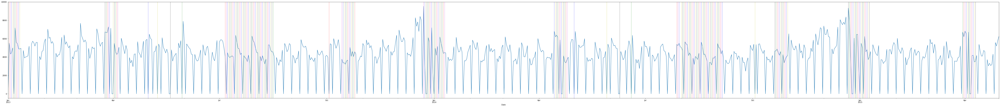

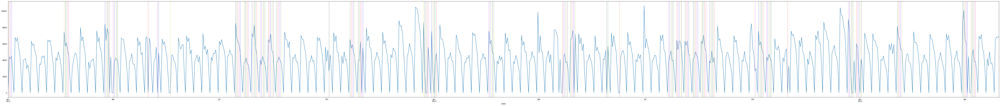

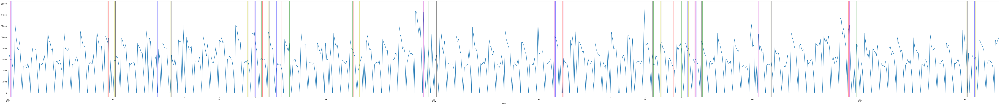

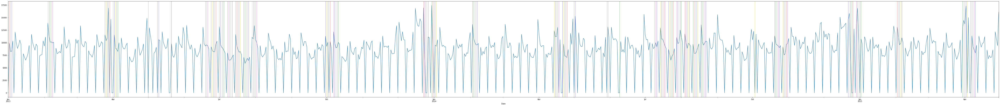

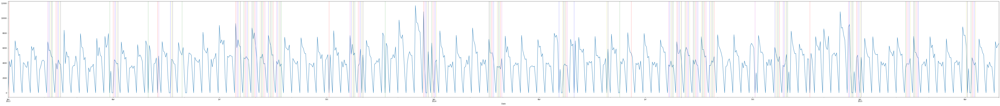

...

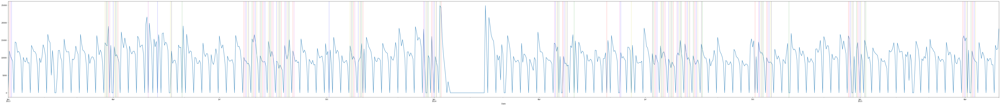

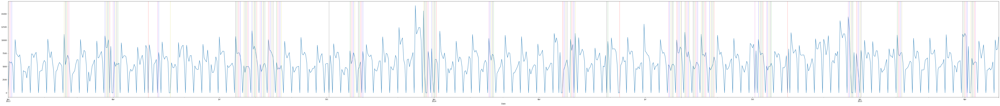

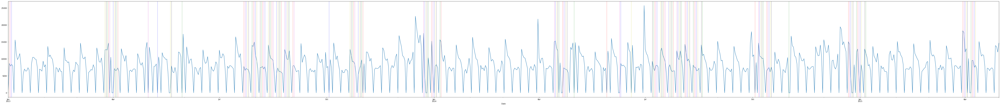

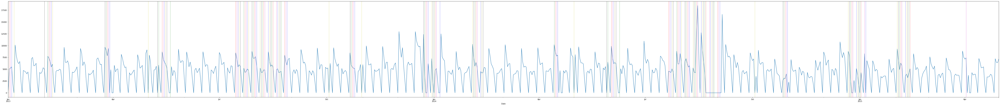

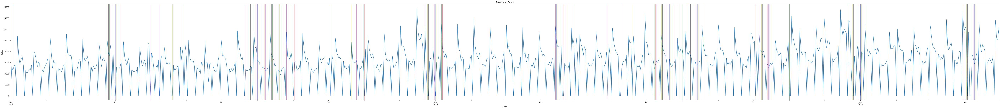

In [108]:
# plt.figure(figsize=(100,10))
for i in range(1, 30):
    df_copy = df.loc[df.Store == i]
    # df_copy = df_copy[(df_copy.index>='2014-01-01') & (df_copy.index < '2014-02-01')]
    df_copy = df_copy.asfreq('D')
    # idx = pd.period_range(min(df_copy.index), max(df_copy.index))
    # df_copy.reindex(idx, fill_value=0)
    # df_copy['Sales'].plot(figsize=(100,10))
    fig, ax = plt.subplots(figsize=(100,10))
    ax = df_copy['Sales'].plot();
    color_arr = ['g', 'r', 'm', 'b', 'y', 'k']
    c_index = 0
    for x in df_copy[(df_copy['SchoolHoliday']==1) | (df_copy['StateHoliday']=='a')].index:
        ax.axvline(x=x, color=color_arr[c_index], linewidth=0.5)
        if color_arr[c_index] == 'k':
            c_index = 0
        else:
            c_index += 1
plt.title('Rossmann Sales')
plt.ylabel('Sales')

In [ ]:
asfreq